<a href="https://colab.research.google.com/github/MohammadJavadSoltani/Change-detection_Histogram-Analysis/blob/main/Change_detection_and_Histogram_Analysis.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# L1_Q2
# MohammadJavadSoltani
98222663;

## ***Analysis of changes***

---



1-1:import all libraries that we nees:

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.measure import label,regionprops,regionprops_table
from skimage import data
import pandas as pd
from skimage.exposure import match_histograms

1-2:read and save images and show the shape:

the master is : 3_A.bmp

In [ ]:
#from google.colab import files
#img1 = files.upload()
master = cv2.imread('3_A.bmp')
slave = cv2.imread('3_B.bmp')
np.shape(master)



Saving 3_A.bmp to 3_A.bmp
Saving 3_B.bmp to 3_B.bmp


(2700, 4725, 3)

1-3: for making sure that master and slave has same shapes:

In [ ]:
np.shape(slave)

(2700, 4725, 3)

1-4:show the histograms:

we calculate histogram for all bands to see witch band is better for us

Text(0.5, 0, 'hist_s0')

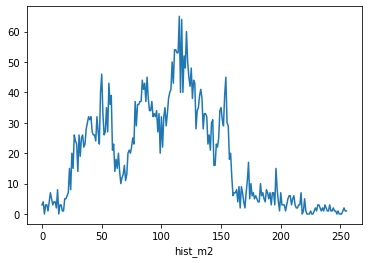

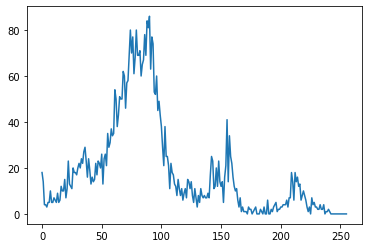

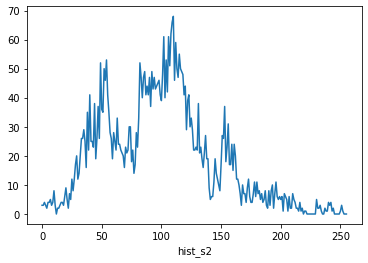

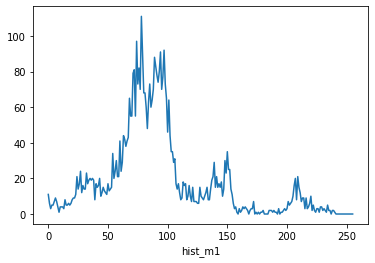

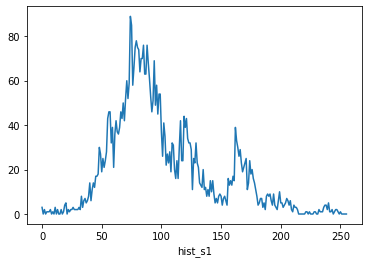

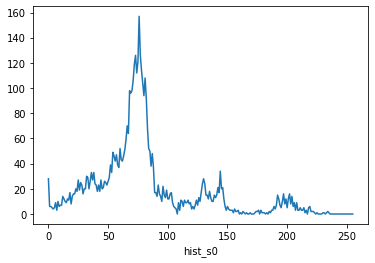

In [ ]:
hist_m2=cv2.calcHist(master[:,:,2],[0],None, [256], [0,256])
hist_s2=cv2.calcHist(slave[:,:,2],[0],None, [256], [0,256])
plt.plot(hist_m2)
plt.xlabel('hist_m2')
plt.figure()
plt.plot(hist_s2)
plt.figure()
plt.xlabel('hist_s2')

hist_m1=cv2.calcHist(master[:,:,1],[0],None, [256], [0,256])
hist_s1=cv2.calcHist(slave[:,:,1],[0],None, [256], [0,256])
plt.plot(hist_m1)
plt.figure()
plt.xlabel('hist_m1')
plt.plot(hist_s1)
plt.figure()
plt.xlabel('hist_s1')

hist_m0=cv2.calcHist(master[:,:,0],[0],None, [256], [0,256])
hist_s0=cv2.calcHist(slave[:,:,0],[0],None, [256], [0,256])
plt.plot(hist_m0)
plt.figure()
plt.xlabel('hist_m0')
plt.plot(hist_s0)
plt.xlabel('hist_s0')

**3: hoistogram_matching** 

we need to match all bands , so we put true infront of multichanel

In [ ]:
match = match_histograms(slave, master, multichannel=True)

3_1 : print the 3 images for comparing the result of matching

Text(0.5, 0, 'match')

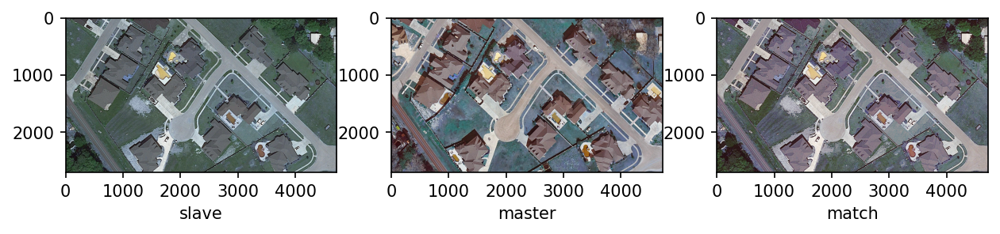

In [ ]:
plt.figure(figsize=(10,10),dpi=150)
plt.subplot(1,3,1)
plt.imshow(slave)
plt.xlabel('slave')
plt.subplot(1,3,2)
plt.imshow(master)
plt.xlabel('master')
plt.subplot(1,3,3)
plt.imshow(match)
plt.xlabel('match')

4_1: deffrent betwen slave and master:

Text(0.5, 0, 'band2')

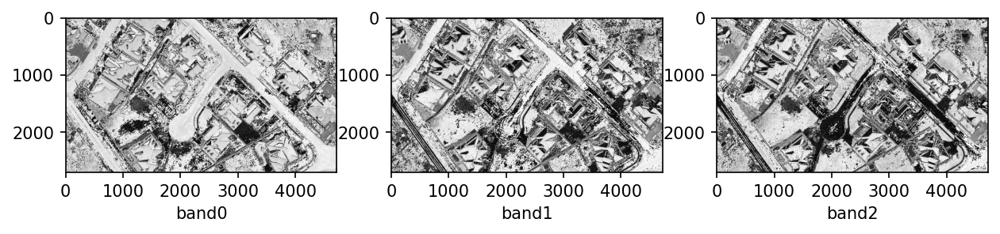

In [ ]:
plt.figure(figsize=(10,10),dpi=150)
plt.subplot(131)
plt.imshow(slave[:,:,0]-master[:,:,0],cmap='gray')
plt.xlabel('band0')
plt.subplot(132)
plt.imshow(slave[:,:,1]-master[:,:,1],cmap='gray')
plt.xlabel('band1')
plt.subplot(133)
plt.imshow(slave[:,:,2]-master[:,:,2],cmap='gray')
plt.xlabel('band2')

as we see it seems that band2 is better than others🥇
so we will work on this band

---



4_2:diffrant betwen match and master:

Text(0.5, 0, 'band2')

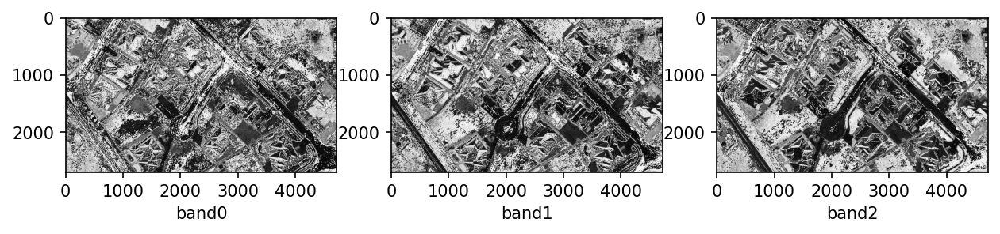

In [ ]:
plt.figure(figsize=(10,10),dpi=150)
plt.subplot(131)
plt.imshow(match[:, :, 0]-master[:, :, 0], cmap='gray')
plt.xlabel('band0')
plt.subplot(132)
plt.imshow(match[:, :, 1]-master[:, :, 1], cmap='gray')
plt.xlabel('band1')
plt.subplot(133)
plt.imshow(match[:, :, 2]-master[:, :, 2], cmap='gray')
plt.xlabel('band2')

also in here we see that band 2 is better ,so we will pick that one🥇

---



4-3: print out the histograms for choosing thrashold:

Text(0.5, 0, 'slave-master')

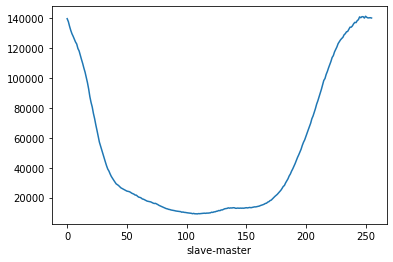

In [ ]:
hist2 = cv2.calcHist([slave[:, :, 2]-master[:, :, 2]], [0], None, [256], [0,256])
plt.plot(hist2)
plt.xlabel('slave-master')

Text(0.5, 0, 'match-master')

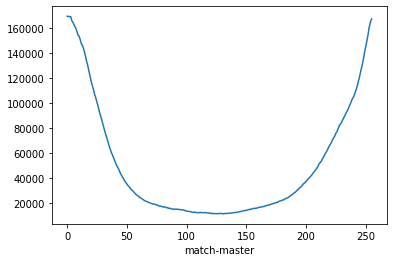

In [ ]:
hist = cv2.calcHist([match[:,:,2]-master[:,:,2]], [0], None, [256], [0,256])
plt.plot(hist)
plt.xlabel('match-master')

for a better compare:

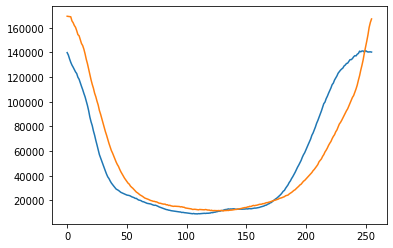

In [ ]:
hist2 = cv2.calcHist([slave[:, :, 2]-master[:, :, 2]], [0], None, [256], [0,256])
plt.plot(hist2)
hist = cv2.calcHist([match[:,:,2]-master[:,:,2]], [0], None, [256], [0,256])
plt.plot(hist)

**5_1: thrashold**   
for slave-master

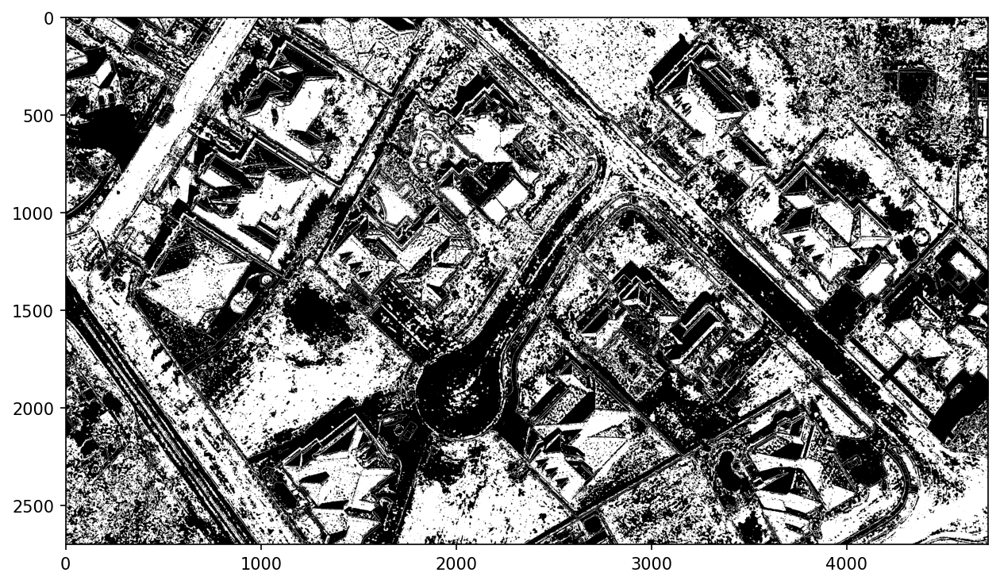

In [ ]:
th = np.zeros_like(master)
th[(slave[:,:,2]-master[:,:,2])>205] = 1
plt.figure(figsize=(10,10),dpi=150)
plt.imshow(th[:, :, 2],cmap = 'gray')


*note:i tried many number from 150 up to 210 ,but the best number that stil show us the diifrance and delete as much as it can , is 205*

**5_2: thrashold**   
for match-master

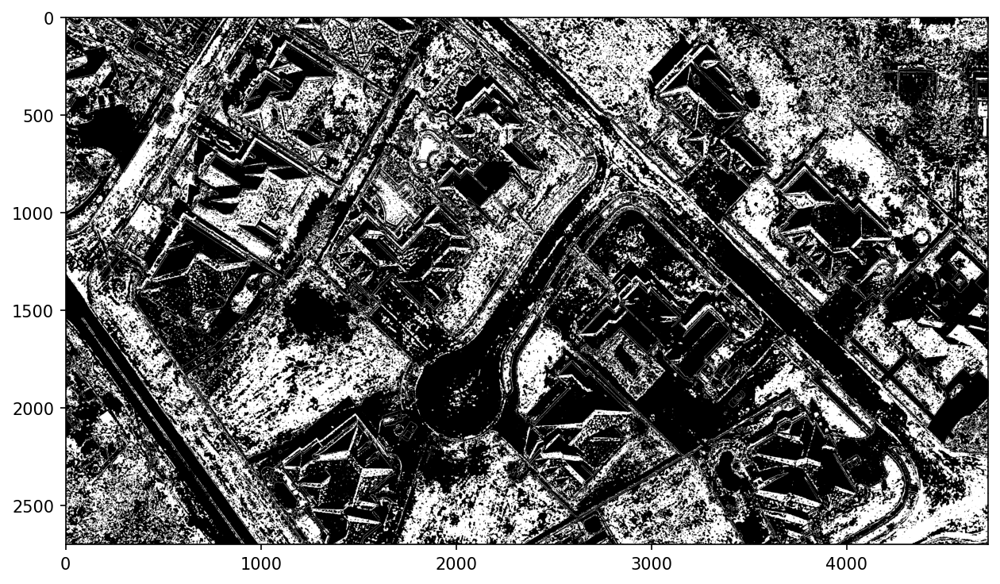

In [ ]:
th = np.zeros_like(master)
th[(match[:,:,2]-master[:,:,2])>210] = 1
plt.figure(figsize=(10,10),dpi=150)
plt.imshow(th[:, :, 2],cmap = 'gray')

*note:i tried many number from 180 up to 220 ,but the best number that stil show us the diifrance and delete as much as it can , is 210*

***as a result obviously the thrashold by matched picture is working better!***

**now , of course there are some places like some roofs os trees that are marked as changes, but with thid algoritem , this is the beast result that we can have.** 

---





# but now let's do all step with another photo as master to see the result:

Text(0.5, 0, 'slave')

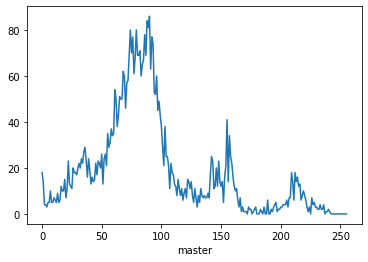

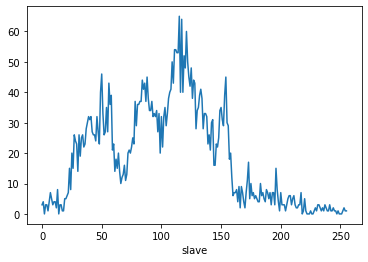

In [ ]:
master2 = cv2.imread('3_B.bmp')
slave2 = cv2.imread('3_A.bmp')
hist_m2=cv2.calcHist(master2[:,:,2],[0],None, [256], [0,256])
hist_s2=cv2.calcHist(slave2[:,:,2],[0],None, [256], [0,256])
plt.plot(hist_m2)
plt.xlabel('master') 
plt.figure()
plt.plot(hist_s2)
plt.xlabel('slave') 

matching and show the result

Text(0.5, 0, 'match')

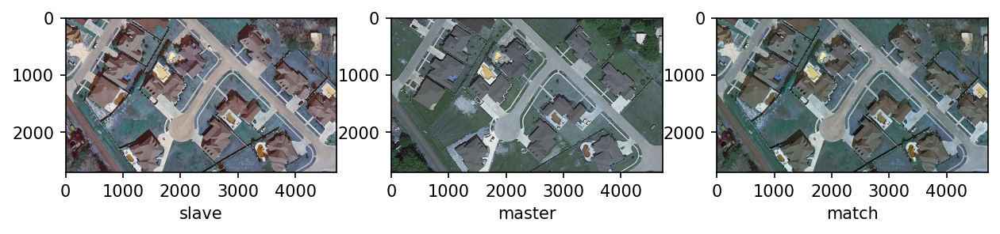

In [ ]:
match2 = match_histograms(slave2, master2, multichannel=True)
plt.figure(figsize=(10,10),dpi=150)
plt.subplot(1,3,1)
plt.imshow(slave2)
plt.xlabel('slave') 
plt.subplot(1,3,2)
plt.imshow(master2)
plt.xlabel('master')
plt.subplot(1,3,3)
plt.imshow(match2)
plt.xlabel('match')

compare betwen bands for: 


> slve - master



Text(0.5, 0, 'band2')

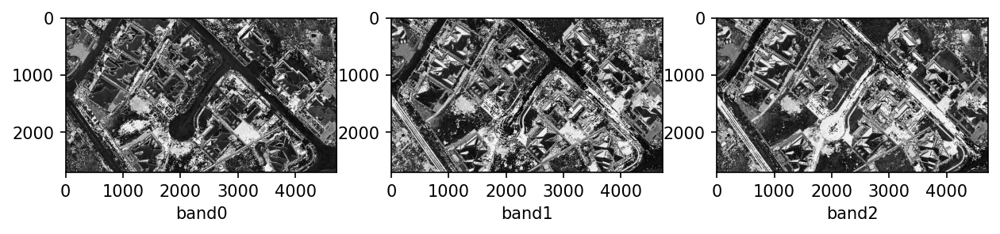

In [ ]:
plt.figure(figsize=(10,10),dpi=150)
plt.subplot(131)
plt.imshow(slave2[:,:,0]-master2[:,:,0],cmap='gray')
plt.xlabel('band0')
plt.subplot(132)
plt.imshow(slave2[:,:,1]-master2[:,:,1],cmap='gray')
plt.xlabel('band1')
plt.subplot(133)
plt.imshow(slave2[:,:,2]-master2[:,:,2],cmap='gray')
plt.xlabel('band2')

compare betwen bands for: 


> match - master


Text(0.5, 0, 'band2')

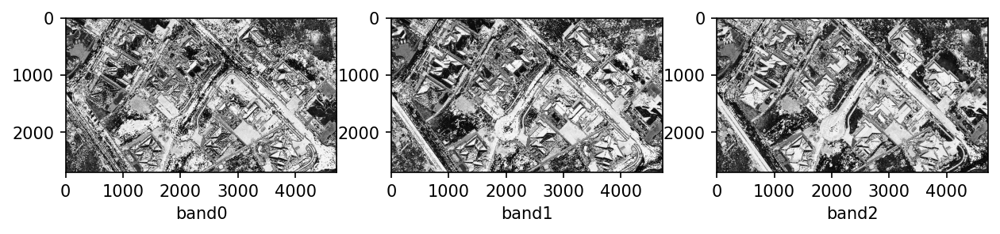

In [ ]:
plt.figure(figsize=(10,10),dpi=150)
plt.subplot(131)
plt.imshow(match2[:, :, 0]-master2[:, :, 0], cmap='gray')
plt.xlabel('band0')
plt.subplot(132)
plt.imshow(match2[:, :, 1]-master2[:, :, 1], cmap='gray')
plt.xlabel('band1')
plt.subplot(133)
plt.imshow(match2[:, :, 2]-master2[:, :, 2], cmap='gray')
plt.xlabel('band2')

it seems that the previos way was better .but lets continue with band2:


---



show the histograms:

Text(0.5, 0, 'match-master')

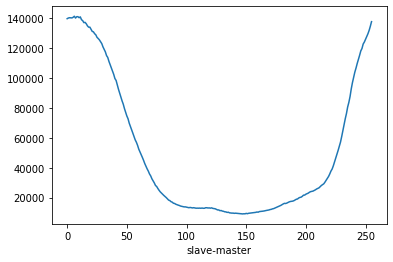

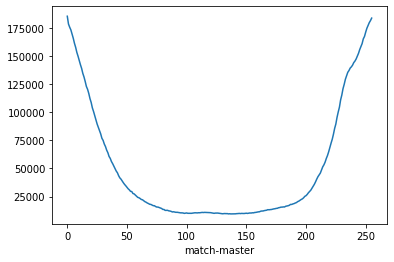

In [ ]:
hist22 = cv2.calcHist([slave2[:, :, 2]-master2[:, :, 2]], [0], None, [256], [0,256])
plt.plot(hist22)
plt.xlabel('slave-master')
hist1 = cv2.calcHist([match2[:,:,2]-master2[:,:,2]], [0], None, [256], [0,256])
plt.figure()
plt.plot(hist1)
plt.xlabel('match-master')

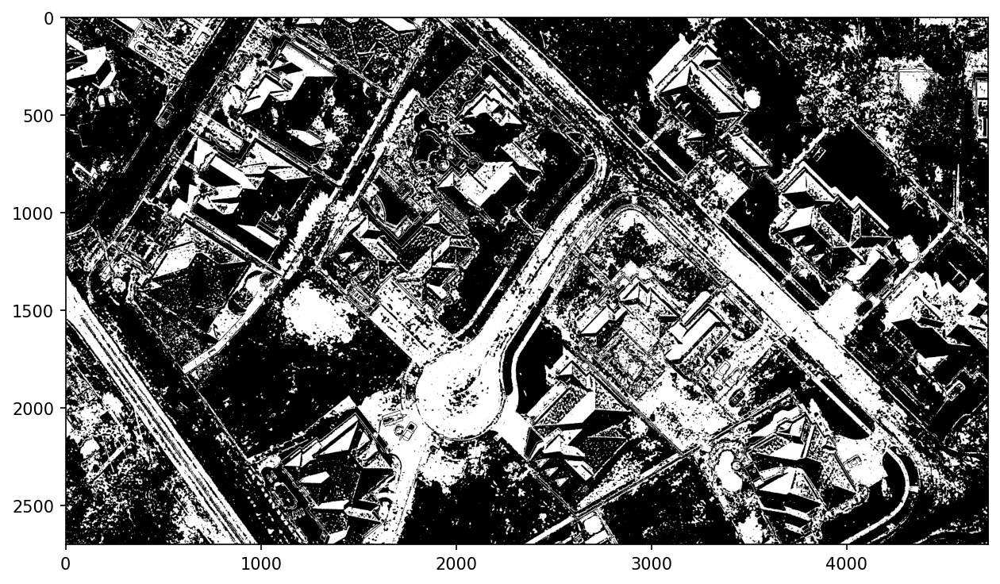

In [ ]:
th2 = np.zeros_like(master2)
th2[(slave2[:,:,2]-master2[:,:,2])>150] = 1
plt.figure(figsize=(10,10),dpi=150)
plt.imshow(th2[:, :, 2],cmap = 'gray')

for this i also try many gray level but it's not working properly and this is the best result⬆

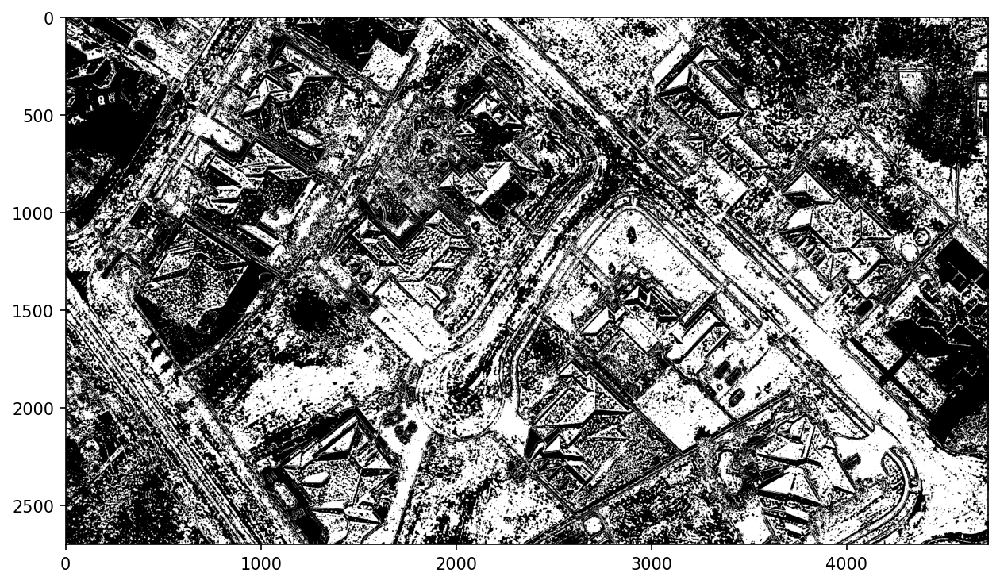

In [ ]:
th2 = np.zeros_like(master2)
th2[(match2[:,:,0]-master2[:,:,0])>210] = 1
plt.figure(figsize=(10,10),dpi=150)
plt.imshow(th2[:, :, 0],cmap = 'gray')

for this i also try many gray level by consedering the histogram plot,but it's not working properly and this is the best result⬆

# According to many researches that i have, we came to the conclusion that with the NDVI parameter, these vegetative parts can be identified to some extent, and by reducing it from the final image, the output can be slightly improved.
# i also used some enhance algorithm fron "envi" to see if it would help us or not.but it didn't really.
# use from different bands or degrees of graylavel are the elements that can help to reach the  maximize efficienct of this algorithm , and if we need a better result, we need to use better and more complex algorithm than this one.